In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from scipy.signal import fftconvolve
import pandas as pd
from scipy.ndimage import uniform_filter, median_filter
import numpy as np
import scipy.optimize as opt
from scipy.signal import fftconvolve
from skimage.io import imread


In [2]:
def reqdim_Img(image):
    image2 = image[33:3097,27:4643]
    return image2

In [3]:
def gaussian_2d(coords, A, x0, y0, sigma_x, sigma_y, offset):
    """ 2D Gaussian function for subpixel peak fitting """
    x, y = coords
    return A * np.exp(-(((x - x0) ** 2) / (2 * sigma_x ** 2) + ((y - y0) ** 2) / (2 * sigma_y ** 2))) + offset

def subpixel_gaussian_fit(cross_corr, max_idx):
    """ Perform 3×3 least-squares Gaussian fit for subpixel displacement """
    y, x = max_idx
    
    if x < 1 or x > cross_corr.shape[1] - 2 or y < 1 or y > cross_corr.shape[0] - 2:
        return float(x), float(y)  # No subpixel correction if peak is on the edge

    x_vals, y_vals = np.meshgrid(np.arange(-1, 2), np.arange(-1, 2))
    data = cross_corr[y-1:y+2, x-1:x+2].flatten()

    initial_guess = (np.max(data), 0, 0, 1, 1, np.min(data))

    try:
        params, _ = opt.curve_fit(gaussian_2d, (x_vals.flatten(), y_vals.flatten()), data, p0=initial_guess)
        sub_x = x + params[1]
        sub_y = y + params[2]
    except RuntimeError:
        sub_x, sub_y = float(x), float(y)

    return sub_x, sub_y

In [4]:
import numpy as np
from scipy.signal import fftconvolve
from scipy.ndimage import median_filter, gaussian_filter

def preprocess_images(image1, image2, median_size=15, gaussian_sigma=1.0):
    """
    Basic PIV image preprocessing:
      1) Convert to float64.
      2) Estimate background via median filter and subtract.
      3) Apply Gaussian smoothing to reduce high-frequency noise.
      4) Normalize each resulting image to zero mean.

    Returns:
      pre1, pre2: two preprocessed 2D arrays.
    """
    # 1) Convert to float64
    img1 = image1.astype(np.float64)
    img2 = image2.astype(np.float64)

    # 2) Estimate background with median filter and subtract
    bg1 = median_filter(img1, size=median_size)
    bg2 = median_filter(img2, size=median_size)
    img1 -= bg1
    img2 -= bg2

    # 3) Gaussian smoothing
    img1 = gaussian_filter(img1, sigma=gaussian_sigma)
    img2 = gaussian_filter(img2, sigma=gaussian_sigma)

    # 4) Zero-mean normalization
    img1 -= np.mean(img1)
    img2 -= np.mean(img2)

    return img1, img2

def piv_multigrid(image1, image2, window_coarse, window_fine, overlap, scale=1.0, dt=1.0):
    """
    Two-pass (multigrid) PIV without extra helper functions.
      image1, image2: 2D NumPy arrays (grayscale, preprocessed)
      window_coarse:  (H0, W0) tuple for coarse interrogation
      window_fine:    (H1, W1) tuple for fine interrogation
      overlap:        step size (pixels) for both passes
      scale:          physical length per pixel (e.g., mm/px)
      dt:             time between frames (s)

    Returns:
      u_fine, v_fine, corr_fine, snr_fine, x_fine, y_fine
      all of shape (ny1, nx1), where
        nx1 = (W_img – W1)//overlap + 1
        ny1 = (H_img – H1)//overlap + 1
    """
    H_img, W_img = image1.shape
    H0, W0 = window_coarse
    H1, W1 = window_fine
    step = overlap
    search_radius = W0 // 2

    # --- Pass 1: Coarse grid displacement ---
    nx0 = (W_img - W0) // step + 1
    ny0 = (H_img - H0) // step + 1
    d0x = np.zeros((ny0, nx0), dtype=np.float64)
    d0y = np.zeros((ny0, nx0), dtype=np.float64)

    for j0 in range(ny0):
        for i0 in range(nx0):
            xs0 = i0 * step
            ys0 = j0 * step

            # Extract H0×W0 from each image and zero‐mean
            w1 = image1[ys0:ys0+H0, xs0:xs0+W0].astype(np.float64)
            w2 = image2[ys0:ys0+H0, xs0:xs0+W0].astype(np.float64)
            w1 -= w1.mean()
            w2 -= w2.mean()

            # Cross-correlation via FFT
            cc = fftconvolve(w1, w2[::-1, ::-1], mode='same')

            # Peak location
            peak_idx = np.unravel_index(np.argmax(cc), cc.shape)

            # Subpixel refinement using user-supplied function
            sub_x, sub_y = subpixel_gaussian_fit(cc, peak_idx)

            # Displacement relative to window center
            dx0 = sub_x - (W0 // 2)
            dy0 = sub_y - (H0 // 2)

            d0x[j0, i0] = dx0
            d0y[j0, i0] = dy0

    # Precompute coarse‐grid centers
    xs_coarse = np.arange(W0//2, W0//2 + nx0*step, step)
    ys_coarse = np.arange(H0//2, H0//2 + ny0*step, step)

    # --- Pass 2: Fine grid displacement ---
    nx1 = (W_img - W1) // step + 1
    ny1 = (H_img - H1) // step + 1

    u_fine = np.zeros((ny1, nx1), dtype=np.float64)
    v_fine = np.zeros((ny1, nx1), dtype=np.float64)
    corr_fine = np.zeros((ny1, nx1), dtype=np.float64)
    snr_fine = np.zeros((ny1, nx1), dtype=np.float64)
    x_fine = np.zeros((ny1, nx1), dtype=np.float64)
    y_fine = np.zeros((ny1, nx1), dtype=np.float64)

    for j1 in range(ny1):
        for i1 in range(nx1):
            xs1 = i1 * step + W1 // 2
            ys1 = j1 * step + H1 // 2

            # ---- interpolate coarse displacement by bilinear from d0x, d0y ----
            fx = (xs1 - xs_coarse[0]) / step
            fy = (ys1 - ys_coarse[0]) / step
            ix = int(np.floor(fx))
            iy = int(np.floor(fy))
            tx = fx - ix
            ty = fy - iy
            ix0 = np.clip(ix, 0, nx0 - 2)
            iy0 = np.clip(iy, 0, ny0 - 2)
            ix1c = ix0 + 1
            iy1c = iy0 + 1

            w00 = (1 - tx) * (1 - ty)
            w10 = tx * (1 - ty)
            w01 = (1 - tx) * ty
            w11 = tx * ty

            u0_pred = (d0x[iy0, ix0] * w00 +
                       d0x[iy0, ix1c] * w10 +
                       d0x[iy1c, ix0] * w01 +
                       d0x[iy1c, ix1c] * w11)
            v0_pred = (d0y[iy0, ix0] * w00 +
                       d0y[iy0, ix1c] * w10 +
                       d0y[iy1c, ix0] * w01 +
                       d0y[iy1c, ix1c] * w11)

            # ---- extract fine window from image1 ----
            x0f = xs1 - W1 // 2
            y0f = ys1 - H1 // 2
            w1f = image1[y0f:y0f+H1, x0f:x0f+W1].astype(np.float64)
            w1f -= w1f.mean()

            # ---- extract integer‐shifted fine window from image2 ----
            ix_shift = int(round(u0_pred))
            iy_shift = int(round(v0_pred))
            x0f2 = x0f + ix_shift
            y0f2 = y0f + iy_shift

            w2f = np.zeros((H1, W1), dtype=np.float64)
            y2_min = max(0, y0f2)
            y2_max = min(H_img, y0f2 + H1)
            x2_min = max(0, x0f2)
            x2_max = min(W_img, x0f2 + W1)
            wy2 = y2_min - y0f2
            wx2 = x2_min - x0f2
            w2f[wy2:wy2+(y2_max-y2_min), wx2:wx2+(x2_max-x2_min)] = image2[y2_min:y2_max, x2_min:x2_max]
            w2f -= w2f.mean()

            # ---- cross-correlation on fine windows ----
            cc_f = fftconvolve(w1f, w2f[::-1, ::-1], mode='same')

            # peak & subpixel
            peak_f = np.unravel_index(np.argmax(cc_f), cc_f.shape)
            sub_xf, sub_yf = subpixel_gaussian_fit(cc_f, peak_f)
            dx_f = sub_xf - (W1 // 2)
            dy_f = sub_yf - (H1 // 2)

            # total fine displacement = coarse_pred + fine subpixel
            dx_total = u0_pred + dx_f
            dy_total = v0_pred + dy_f

            # compute SNR on cc_f
            flat = cc_f.flatten()
            P1 = cc_f[peak_f]
            flat_no1 = np.delete(flat, np.argmax(flat))
            P2 = np.max(flat_no1) if flat_no1.size > 0 else 1e-12
            snr_val = P1 / (P2 + 1e-12)

            # store results (physical units)
            u_fine[j1, i1] = (dx_total * scale) / dt
            v_fine[j1, i1] = (dy_total * scale) / dt
            corr_fine[j1, i1] = P1
            snr_fine[j1, i1] = snr_val
            x_fine[j1, i1] = xs1 * scale
            y_fine[j1, i1] = (H_img - ys1) * scale

    return u_fine, v_fine, corr_fine, snr_fine, x_fine, y_fine


In [5]:
raw_image1 = imread(r"D:\PIV\Sample_high_speed_data\Sample_high_speed_data\Raw_images\00000021.tif", as_gray=True)
raw_image2 = imread(r"D:\PIV\Sample_high_speed_data\Sample_high_speed_data\Raw_images\00000022.tif", as_gray=True)

In [6]:
raw_image1.shape

(3280, 4904)

In [7]:
image1 = reqdim_Img(raw_image1) #(3064, 4616)
image2 = reqdim_Img(raw_image2) #(3064, 4616)


pre1, pre2 = preprocess_images(image1, image2,
                                median_size=15, gaussian_sigma=1.0)

# 2) Call the multigrid PIV routine on preprocessed images
W0, W1 = (96, 96), (40, 40)   # coarse = 64×64, fine = 32×32
overlap = 16                 # 50% overlap
scale = 1                 # mm/px
dt = 1                   # 1s between frames

u, v, corr, snr, X, Y = piv_multigrid(
    image1, image2,
    window_coarse=W0,
    window_fine=W1,
    overlap=overlap,
    scale=scale,
    dt=dt
)


C:\Users\anura\AppData\Local\Temp\ipykernel_31096\2172970553.py:19: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = opt.curve_fit(gaussian_2d, (x_vals.flatten(), y_vals.flatten()), data, p0=initial_guess)


In [45]:
X = X + 27


In [44]:
Y = Y + 33

In [46]:
Y

array([[3077., 3077., 3077., ..., 3077., 3077., 3077.],
       [3061., 3061., 3061., ..., 3061., 3061., 3061.],
       [3045., 3045., 3045., ..., 3045., 3045., 3045.],
       ...,
       [  85.,   85.,   85., ...,   85.,   85.,   85.],
       [  69.,   69.,   69., ...,   69.,   69.,   69.],
       [  53.,   53.,   53., ...,   53.,   53.,   53.]])

In [47]:
X

array([[  47.,   63.,   79., ..., 4591., 4607., 4623.],
       [  47.,   63.,   79., ..., 4591., 4607., 4623.],
       [  47.,   63.,   79., ..., 4591., 4607., 4623.],
       ...,
       [  47.,   63.,   79., ..., 4591., 4607., 4623.],
       [  47.,   63.,   79., ..., 4591., 4607., 4623.],
       [  47.,   63.,   79., ..., 4591., 4607., 4623.]])

In [48]:
u_flat = u.flatten()
v_flat = v.flatten()
delta_x_flat = X.flatten()
delta_y_flat = Y.flatten()
correlation_flat = corr.flatten()

# Create a DataFrame with the flattened arrays
data = {
    'u': u_flat,
    'v': v_flat,
    'x': delta_x_flat,
    'dy': delta_y_flat,
    'correlation': correlation_flat
}

df1111 = pd.DataFrame(data)

# Save the DataFrame to a .dpiv file (CSV format with a .dpiv extension)


In [39]:
df111.to_csv('SuperSonic Check1.csv', index=False, sep='\t', header=False, float_format='%.6f')

In [25]:
df1

,u,v,x,dy,correlation
0,0.378864,-1.524009,47.0,53.0,0.368233
1,0.474874,-2.020292,63.0,53.0,0.373459
2,0.198356,-1.866103,79.0,53.0,0.515019
3,0.055102,-1.785855,95.0,53.0,0.546753
4,0.166542,-0.772337,111.0,53.0,0.711212
...,...,...,...,...,...
53290,3.954707,-14.908842,4527.0,3029.0,-0.092736
53291,-8.308797,-27.630536,4543.0,3029.0,0.347243
53292,-7.696241,-28.222700,4559.0,3029.0,0.190567
53293,7.246022,-7.333636,4575.0,3029.0,-0.020864


In [40]:
df111

,u,v,x,dy,correlation
0,0.064788,-1.989398,47.0,3077.0,1827.734824
1,0.167991,-1.844432,63.0,3077.0,2606.841856
2,-0.433516,-2.150522,79.0,3077.0,2040.349046
3,-0.753990,-2.747310,95.0,3077.0,1036.469192
4,-0.741453,-2.212791,111.0,3077.0,9080.394802
...,...,...,...,...,...
54525,4.298262,-16.941306,4559.0,53.0,29586.617118
54526,6.818612,-17.853247,4575.0,53.0,41661.050661
54527,3.756904,9.901295,4591.0,53.0,10222.864113
54528,-9.547445,11.836540,4607.0,53.0,20136.601467


In [49]:
df1111

,u,v,x,dy,correlation
0,-0.702357,-2.985930,47.0,3077.0,7526.314375
1,-0.540165,-2.785102,63.0,3077.0,10047.188656
2,-0.690393,-2.823922,79.0,3077.0,8939.557750
3,-0.599484,-2.900755,95.0,3077.0,7450.346531
4,-0.408322,-2.581719,111.0,3077.0,25664.070219
...,...,...,...,...,...
54525,-0.441114,-26.144310,4559.0,53.0,51522.097752
54526,4.847058,-17.301706,4575.0,53.0,55837.698437
54527,-14.622385,-7.561202,4591.0,53.0,37155.574422
54528,-16.108392,-4.837919,4607.0,53.0,50528.891875


In [25]:
import numpy as np
import matplotlib.pyplot as plt

def plot_vectors_and_contour(u, v, original_image, magnitude_threshold):
    # Determine the shape of the grid
    ny, nx = np.transpose(u).shape

    # Create a grid of coordinates for the vector starting points
    x = np.arange(nx)
    y = np.arange(ny)
    X, Y = np.meshgrid(x, y)
    print(nx,ny)
    # Calculate the magnitude of the vectors
    magnitude = np.sqrt(u**2 + v**2)

    # Apply threshold to magnitude
    magnitude[magnitude < magnitude_threshold] = 0  # Set small magnitudes to zero

    # Normalize the vectors to ensure equal arrow lengths
    u_normalized = np.where(magnitude > 0, u / (magnitude + 1e-10), 0)  # Zero out small vectors
    v_normalized = np.where(magnitude > 0, v / (magnitude + 1e-10), 0)

# Plot the original image
    plt.figure(figsize=(20, 12))
    plt.imshow(original_image, cmap='gray', extent=(0, nx, 0, ny))
    
# Overlay the vector field with color representing magnitude
    plt.quiver(
        X, 
        ny - 1 - Y, 
        np.transpose(u_normalized), 
        np.transpose(v_normalized), 
        magnitude.T,  # Color represents magnitude
        scale=0.8,  # Adjust scale for arrow length
        scale_units='xy', 
        angles='xy', 
        cmap='rainbow'  # Colormap for magnitude
    )
    plt.colorbar(label='Vector Magnitude')  # Add colorbar to represent magnitude scale
    plt.title('Vector Field Overlaid on Original Image')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid()
    plt.show()
    ##plain quiver
    plt.figure(figsize=(20,12))
    plt.quiver(
        X, 
        ny - 1 - Y, 
        np.transpose(u_normalized), 
        np.transpose(v_normalized), 
        magnitude.T,  # Color represents magnitude
        scale=1,  # Adjust scale for arrow length
        scale_units='xy', 
        angles='xy', 
        cmap='rainbow'  # Colormap for magnitude
    )
    plt.colorbar(label='Vector Magnitude')  # Add colorbar to represent magnitude scale
    plt.title('Vector Field Overlaid on Original Image')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid()
    plt.show()

    
    plt.figure(figsize=(20, 12))
    plt.imshow(original_image, cmap='gray', extent=(0, nx, 0, ny))
    
        # Plot contour plots
    plt.figure(figsize=(15, 9))
    magnitude_resultant = np.sqrt(u**2 + v**2)
    plt.contourf(np.transpose(magnitude_resultant), cmap='jet')
    plt.colorbar()
    plt.title('Resultant Magnitude of Velocity')
    plt.xlabel('X')
    plt.ylabel('Y')

    plt.tight_layout()
    plt.show()


305 204


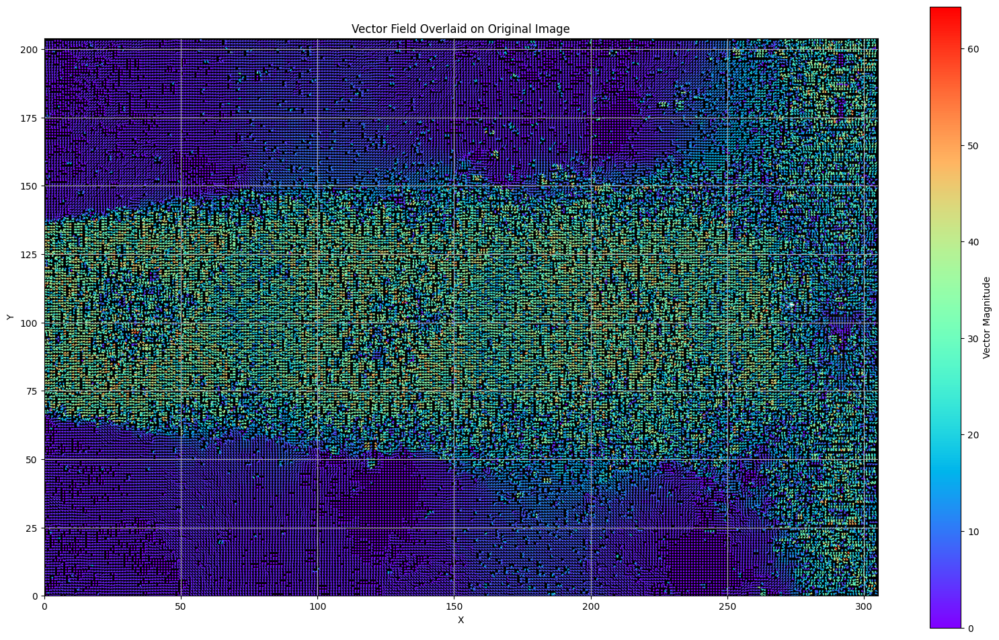

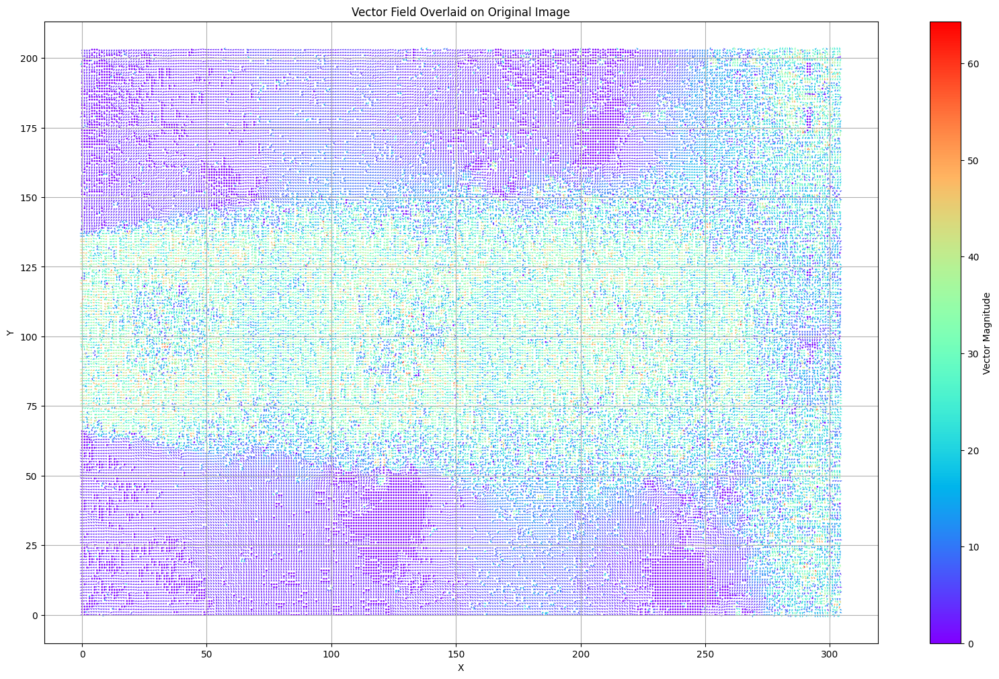

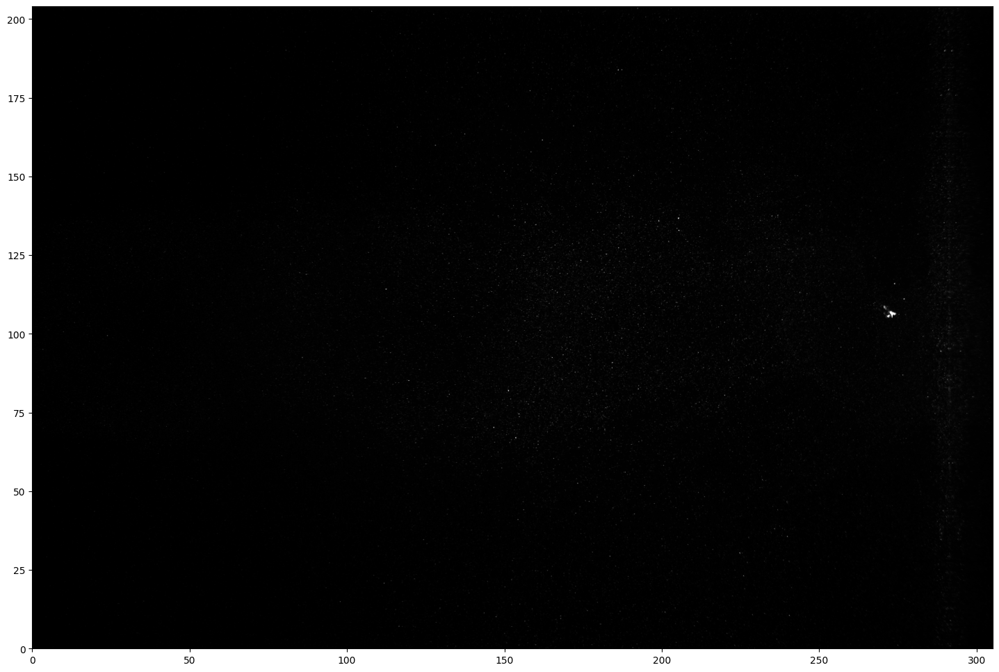

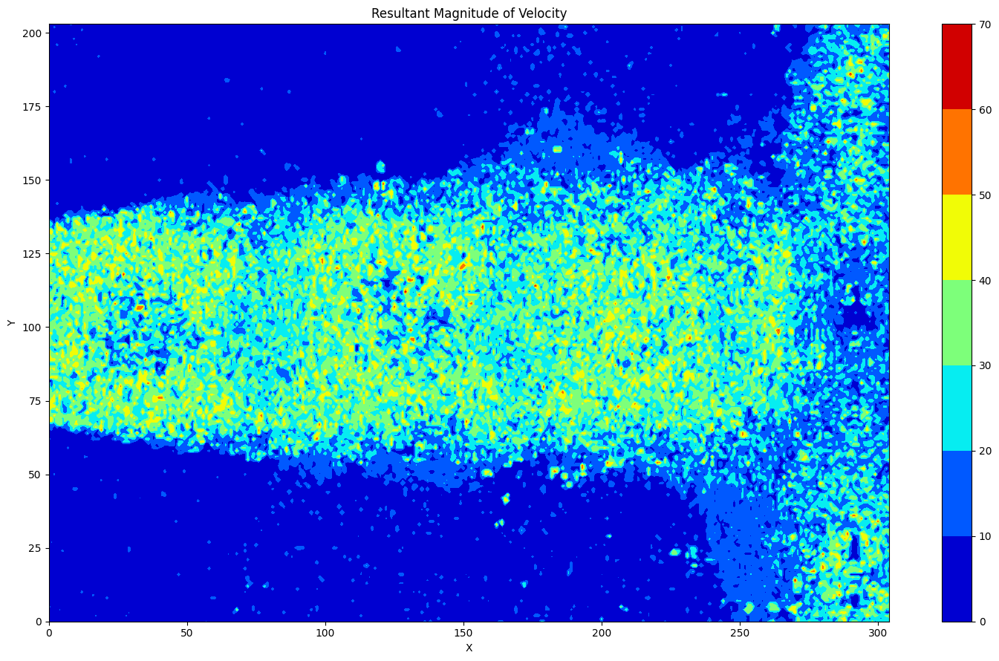

In [26]:
if __name__ == "__main__":
    image1 = imread(r"D:\PIV\Data_transfer\content\00000021.tif", as_gray=True)



    # Plot vectors and contour plots
    plot_vectors_and_contour(u.T, v.T, image1, 2)

In [14]:
import numpy as np

def filter_hart_chi2(u, v, hart_thresh, chi2_thresh):
    """
    Apply Hart (8-neighbor median) and 13-point Chi-Square filtering to velocity fields.

    Inputs:
      u, v         : 2D arrays of raw velocity components
      hart_thresh  : distance threshold (in same units as u, v) for Hart median filter
      chi2_thresh  : Chi-Square threshold (e.g., ~5.99 for 95% confidence with 2 dof)

    Returns:
      u_filt, v_filt : 2D arrays of filtered velocity components
    """
    ny, nx = u.shape
    u_filt = u.copy()
    v_filt = v.copy()

    # 1) Hart filter (8-neighbor median)
    for j in range(1, ny - 1):
        for i in range(1, nx - 1):
            # gather 8 immediate neighbors
            nb_u = np.array([
                u_filt[j-1, i-1], u_filt[j-1, i], u_filt[j-1, i+1],
                u_filt[j,   i-1],               u_filt[j,   i+1],
                u_filt[j+1, i-1], u_filt[j+1, i], u_filt[j+1, i+1]
            ])
            nb_v = np.array([
                v_filt[j-1, i-1], v_filt[j-1, i], v_filt[j-1, i+1],
                v_filt[j,   i-1],               v_filt[j,   i+1],
                v_filt[j+1, i-1], v_filt[j+1, i], v_filt[j+1, i+1]
            ])
            # median of neighbors
            median_u = np.median(nb_u)
            median_v = np.median(nb_v)
            # deviation from median
            dev = np.hypot(u_filt[j, i] - median_u, v_filt[j, i] - median_v)
            if dev > hart_thresh:
                u_filt[j, i] = median_u
                v_filt[j, i] = median_v

    # 2) Chi-Square filter (13-point)
    for j in range(2, ny - 2):
        for i in range(2, nx - 2):
            # gather 12 neighbors: 8 immediate + 4 at distance 2 along axes
            offsets = [(-1, -1), (-1,  0), (-1,  1),
                       ( 0, -1),           ( 0,  1),
                       ( 1, -1), ( 1,  0), ( 1,  1),
                       (-2,  0), ( 2,  0), ( 0, -2), ( 0,  2)]
            nb_u = []
            nb_v = []
            for dy, dx in offsets:
                nb_u.append(u_filt[j + dy, i + dx])
                nb_v.append(v_filt[j + dy, i + dx])
            nb_u = np.array(nb_u)
            nb_v = np.array(nb_v)

            # local mean
            u_mean = nb_u.mean()
            v_mean = nb_v.mean()

            # local variances (unbiased)
            var_u = ((nb_u - u_mean) ** 2).sum() / (len(nb_u) - 1)
            var_v = ((nb_v - v_mean) ** 2).sum() / (len(nb_v) - 1)
            sigma2 = 0.5 * (var_u + var_v)
            if sigma2 < 1e-12:
                continue

            # chi-square statistic for center
            du = u_filt[j, i] - u_mean
            dv = v_filt[j, i] - v_mean
            chi2 = (du * du + dv * dv) / sigma2
            if chi2 > chi2_thresh:
                u_filt[j, i] = u_mean
                v_filt[j, i] = v_mean

    return u_filt, v_filt


In [19]:
hart_threshold = 3
chi2_threshold = 5.99   # ~95% confidence with 2 degrees of freedom

u_filtered, v_filtered = filter_hart_chi2(u, v, hart_threshold, chi2_threshold)


305 204


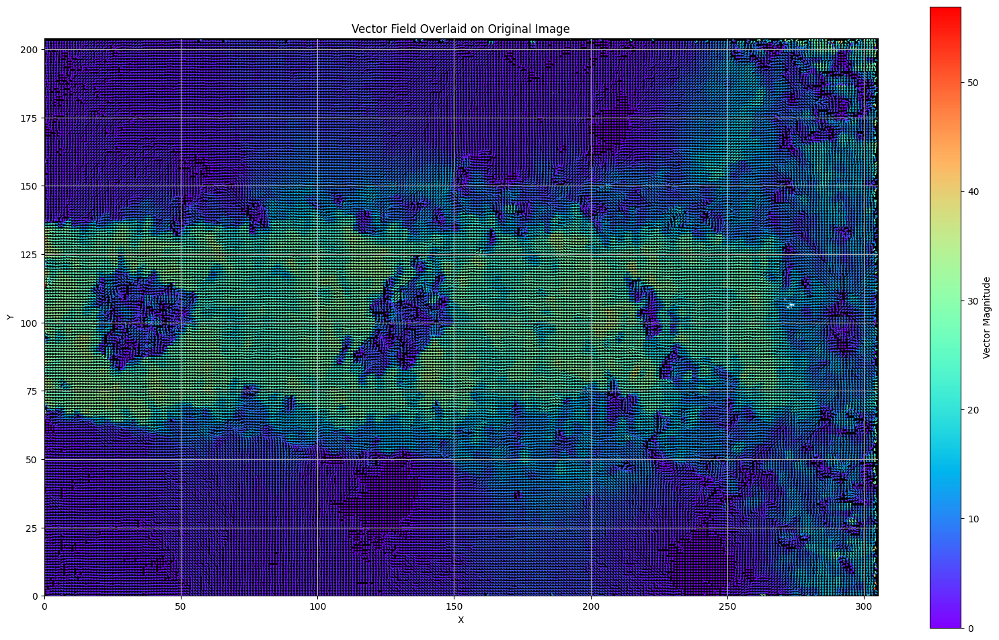

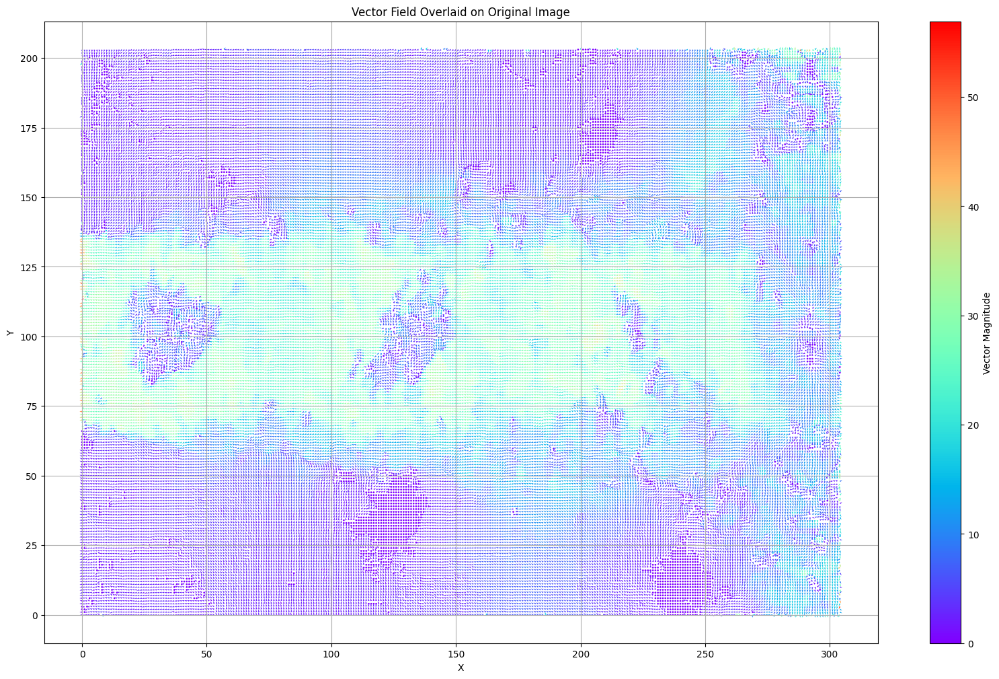

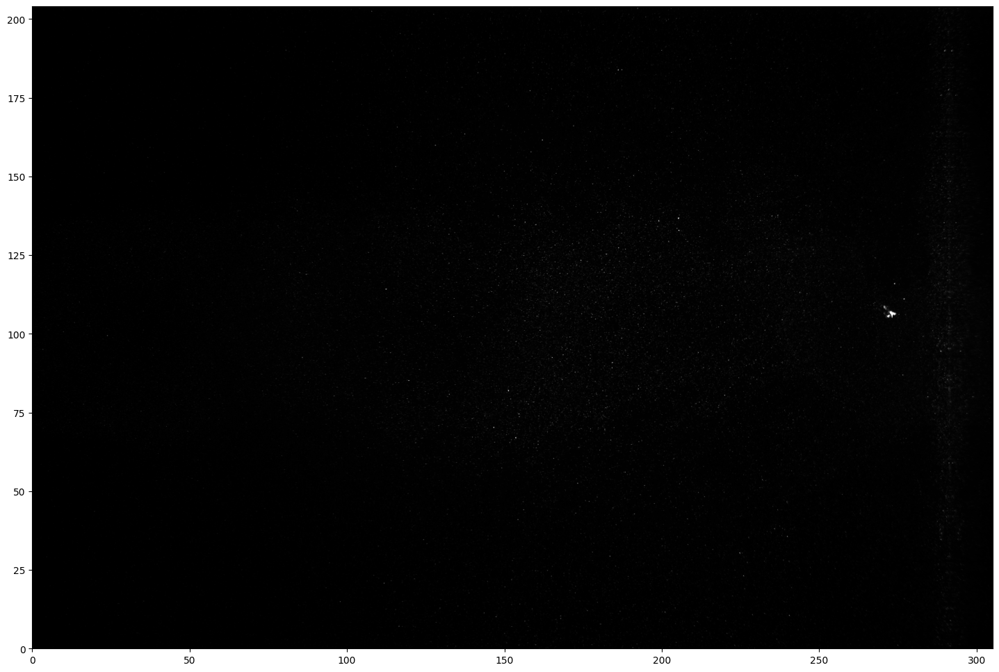

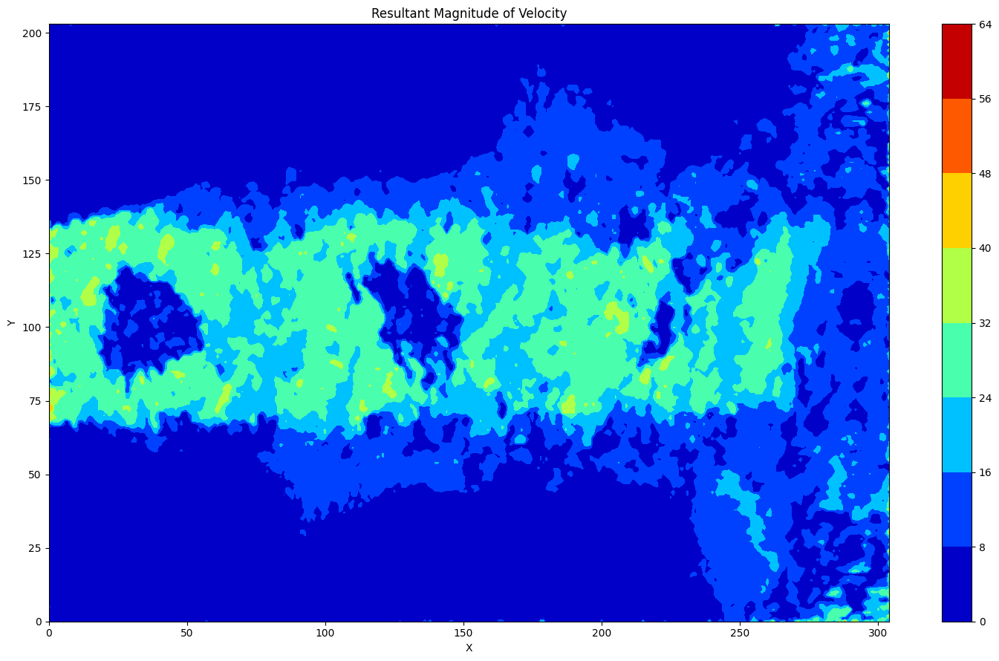

In [21]:
if __name__ == "__main__":
    image1 = imread(r"D:\PIV\Data_transfer\content\00000021.tif", as_gray=True)



    # Plot vectors and contour plots
    plot_vectors_and_contour(u_filtered.T, v_filtered.T, image1, 1)

In [36]:
raw_image1 = imread(r"D:\PIV\Data_transfer\content\00000021.tif", as_gray=True)


In [37]:
raw_image1.shape

(3280, 4904)

In [47]:
raw_image11 = reqdim_Img(raw_image1)

In [48]:
raw_image11.shape

(3064, 4616)

In [46]:
def reqdim_Img(image):
    image2 = image[33:3097,27:4643]
    return image2


In [11]:
import pandas as pd
import numpy as np

# Load the data
df11 = pd.read_csv("D:\PIV\DataSupersonic Check1.csv")

# Pivot the data to create 2D arrays
x_vals = np.sort(df11['x'].unique())
dy_vals = np.sort(df11['y'].unique())

# Create a pivot table and sort by y descending (to match image-like orientation)
U1 = df11.pivot(index='y', columns='x', values='u').sort_index(ascending=False).values
V1 = df11.pivot(index='y', columns='x', values='v').sort_index(ascending=False).values


<>:5: SyntaxWarning: invalid escape sequence '\P'
<>:5: SyntaxWarning: invalid escape sequence '\P'
C:\Users\anura\AppData\Local\Temp\ipykernel_31096\3483404370.py:5: SyntaxWarning: invalid escape sequence '\P'
  df11 = pd.read_csv("D:\PIV\DataSupersonic Check1.csv")


In [12]:
U1

array([[ 0.1610277 ,  0.06336965,  0.03080559, ...,  3.852638  ,
         2.755336  ,  1.654201  ],
       [ 0.154052  ,  0.06627335,  0.04359928, ...,  3.872237  ,
         2.649801  ,  1.423104  ],
       [ 0.1577576 ,  0.07986388,  0.06708553, ...,  3.228214  ,
         1.878321  ,  0.5237322 ],
       ...,
       [ 1.425301  ,  1.127182  ,  0.9926407 , ...,  1.900391  ,
         4.724609  ,  7.566406  ],
       [ 1.141787  ,  0.7837406 ,  0.5907766 , ..., -0.09375   ,
         2.638672  ,  5.392578  ],
       [ 0.5321136 ,  0.1152788 , -0.1369125 , ..., -5.453125  ,
        -2.814453  , -0.1757812 ]])

In [18]:
U1.shape

(190, 287)

In [13]:
V1

array([[-8.275965e-01, -8.370472e-01, -8.233472e-01, ...,  2.621719e+01,
         2.792252e+01,  2.963323e+01],
       [-9.572896e-01, -9.606087e-01, -9.407726e-01, ...,  3.291198e+01,
         3.380582e+01,  3.470226e+01],
       [-1.012313e+00, -1.009492e+00, -9.835125e-01, ...,  3.526562e+01,
         3.533278e+01,  3.539968e+01],
       ...,
       [ 2.641784e-01,  1.832523e-01,  8.863509e-02, ..., -1.927051e+01,
        -2.169238e+01, -2.412305e+01],
       [ 2.498929e-01,  5.191963e-02, -1.598209e-01, ..., -1.898340e+01,
        -2.052148e+01, -2.206543e+01],
       [ 3.328891e-03, -3.128030e-01, -6.427711e-01, ..., -1.903125e+01,
        -1.968164e+01, -2.033594e+01]])

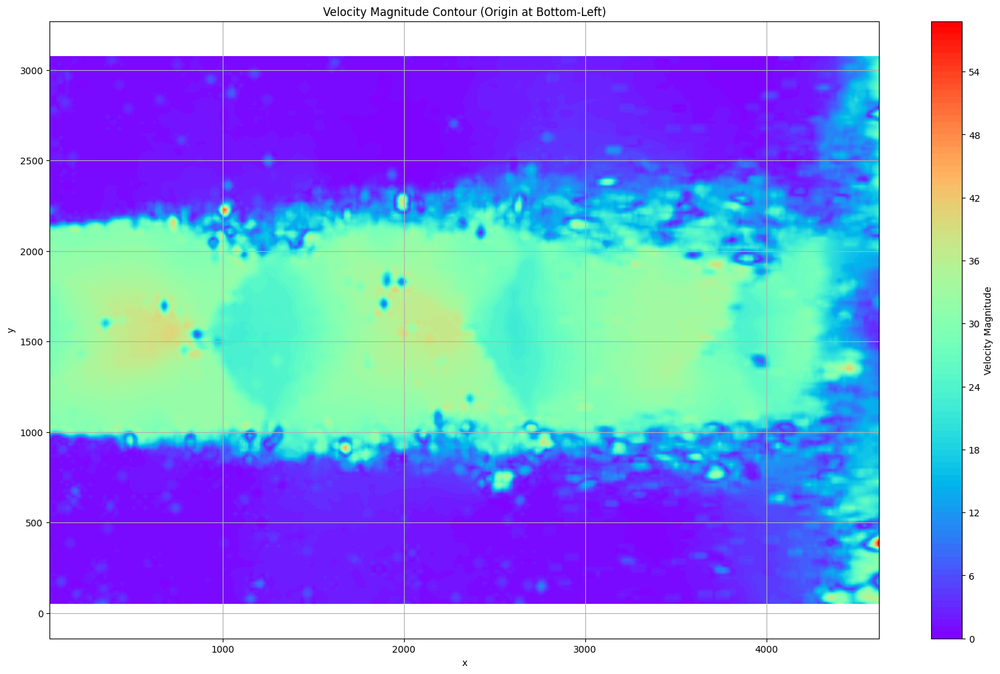

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
df11 = pd.read_csv(r"D:\PIV\DataSupersonic Check1.csv")

# Extract and sort coordinates
x_vals = np.sort(df11['x'].unique())
y_vals = np.sort(df11['y'].unique())

# Create 2D fields (image-style orientation)
U1 = df11.pivot(index='y', columns='x', values='u').sort_index(ascending=False).values
V1 = df11.pivot(index='y', columns='x', values='v').sort_index(ascending=False).values

# Flip arrays to restore bottom-left origin
U_plot = np.flipud(U1)
V_plot = np.flipud(V1)

# Compute velocity magnitude
velocity_magnitude = np.sqrt(U_plot**2 + V_plot**2)

# Create meshgrid for plotting
X, Y = np.meshgrid(x_vals, y_vals[::-1])  # y_vals[::-1] matches flip

# Plot contour
plt.figure(figsize=(20, 12))
contour = plt.contourf(X, Y, velocity_magnitude, levels=100, cmap='rainbow')
plt.colorbar(contour, label='Velocity Magnitude')
plt.title('Velocity Magnitude Contour (Origin at Bottom-Left)')
plt.xlabel('x')
plt.ylabel('y')
plt.axis('equal')
plt.grid(True)
plt.show()
